In [1]:
from PIL import Image
import os
import pandas as pd
import numpy as np
import datasets
from tqdm import tqdm
from datasets import Image as Image_ds # change name because of similar PIL module
from datasets import Dataset
from datasets import load_dataset
import urllib.parse
import json
import pickle
import matplotlib.pyplot as plt 
from sklearn.neighbors import NearestNeighbors
import sys
sys.path.append(os.path.abspath(".."))
from src.utils import plot_neighbors, pca_binary, plot_pca_scale
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.decomposition import PCA
from matplotlib.patches import Patch
from sklearn.metrics.pairwise import cosine_distances
import seaborn as sns
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist
from sklearn.manifold import TSNE
from umap import UMAP

# we get a lot of annoying warnings from sklearn so we suppress them
import warnings
warnings.filterwarnings('ignore')

/Users/au672746/Library/CloudStorage/OneDrive-Aarhusuniversitet/CHC/canon-paintings-smk/env/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# read df from pickle 
data_path = os.path.join('..', 'data')
df = pd.read_pickle(os.path.join(data_path, 'paintings_canonized.pkl'))

In [3]:
# load image data
ds = load_dataset("louisebrix/smk_only_paintings", split="train") # all the data is in the 'train' split

In [4]:
# load metadata json
json_path = os.path.join(data_path, 'metadata_paintings')

# Open and read the JSON file
with open(json_path, 'r') as file:
    metadata = json.load(file)

In [5]:
df['materials'] = [item.get('materials', pd.NA) for item in metadata]

In [7]:
materials_list = []
first_tags_list = []
for idx, row in df.iterrows():

    if isinstance(row['materials'], list):
        materials_list.append(row['materials'][0])
    else:
        materials_list.append(pd.NA)
    
    if isinstance(row['tags_en'], list):
        first_tags_list.append(row['tags_en'][0])
    
    else:
        first_tags_list.append(pd.NA)

df['materials'] = materials_list
df['technique'] = df['techniques'].explode()
df['first_tag'] = first_tags_list

In [8]:
# define color subset

# make subset of colored images only 
color_subset = df.query('rgb == "color"')
color_idx = color_subset.index.tolist()
ds_color = ds.select(color_idx)
color_subset = color_subset.reset_index(drop = True)

### PCA with images

Code taken from https://fcpython.com/visualisation/creating-scatter-plots-with-club-logos-in-python

 https://nextjournal.com/ml4a/image-t-sne 

In [124]:
# 
def getImage(img):
    return OffsetImage(np.array(img), zoom=.02)


In [116]:
def pca_binary(ax, df, ds, embedding):
    embeddings_array = np.array(df[embedding].to_list(), dtype=np.float32)

    # to 2 dimensions
    pca = PCA(n_components=2)
    pca_results = pca.fit_transform(embeddings_array)
    df_pca = pd.DataFrame(pca_results, columns=["PCA1", "PCA2"])
    
    ax.scatter(df_pca["PCA1"], df_pca["PCA2"], color='white')

    ax.set_xlabel("PCA1")
    ax.set_ylabel("PCA2")

    ax.axis("equal")
    ax.set_axis_off()

    for index, row in df_pca.iterrows():
        # add images to plot
        ab = AnnotationBbox(getImage(ds[index]['image']), (row["PCA1"], row["PCA2"]), frameon=False)
        ax.add_artist(ab)

    #plt.savefig(filename)

    np.seterr(divide='ignore', invalid='ignore')

/Users/au672746/Library/CloudStorage/OneDrive-Aarhusuniversitet/CHC/canon-paintings-smk/env/lib/python3.13/site-packages/sklearn/utils/extmath.py:335: RuntimeWarning: divide by zero encountered in matmul
  Q, _ = normalizer(A @ Q)
/Users/au672746/Library/CloudStorage/OneDrive-Aarhusuniversitet/CHC/canon-paintings-smk/env/lib/python3.13/site-packages/sklearn/utils/extmath.py:335: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A @ Q)
/Users/au672746/Library/CloudStorage/OneDrive-Aarhusuniversitet/CHC/canon-paintings-smk/env/lib/python3.13/site-packages/sklearn/utils/extmath.py:335: RuntimeWarning: invalid value encountered in matmul
  Q, _ = normalizer(A @ Q)
/Users/au672746/Library/CloudStorage/OneDrive-Aarhusuniversitet/CHC/canon-paintings-smk/env/lib/python3.13/site-packages/sklearn/utils/extmath.py:336: RuntimeWarning: divide by zero encountered in matmul
  Q, _ = normalizer(A.T @ Q)
/Users/au672746/Library/CloudStorage/OneDrive-Aarhusuniversitet/CHC/canon-paintin

Text(0.5, 0.98, 'PCA with paintings, greyscale')

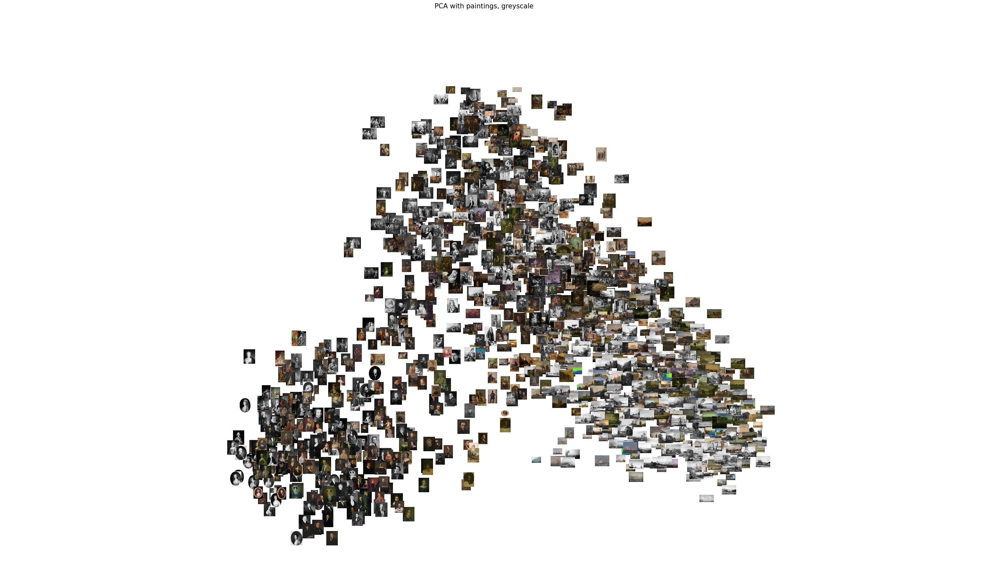

In [8]:
fig, axs = plt.subplots(1, 1, figsize=(40, 20))

pca_binary(axs, df, ds, 'grey_embedding', 'pca_paintings_grey.png')

fig.suptitle('PCA with paintings, greyscale', size = 15)


/Users/au672746/Library/CloudStorage/OneDrive-Aarhusuniversitet/CHC/canon-paintings-smk/env/lib/python3.13/site-packages/sklearn/utils/extmath.py:335: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A @ Q)
/Users/au672746/Library/CloudStorage/OneDrive-Aarhusuniversitet/CHC/canon-paintings-smk/env/lib/python3.13/site-packages/sklearn/utils/extmath.py:336: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A.T @ Q)
/Users/au672746/Library/CloudStorage/OneDrive-Aarhusuniversitet/CHC/canon-paintings-smk/env/lib/python3.13/site-packages/sklearn/utils/extmath.py:340: RuntimeWarning: overflow encountered in matmul
  Q, _ = qr_normalizer(A @ Q)
/Users/au672746/Library/CloudStorage/OneDrive-Aarhusuniversitet/CHC/canon-paintings-smk/env/lib/python3.13/site-packages/sklearn/utils/extmath.py:533: RuntimeWarning: overflow encountered in matmul
  B = Q.T @ M
/Users/au672746/Library/CloudStorage/OneDrive-Aarhusuniversitet/CHC/canon-paintings-smk/env/lib/python3.13/s

Text(0.5, 0.98, 'PCA with paintings, color')

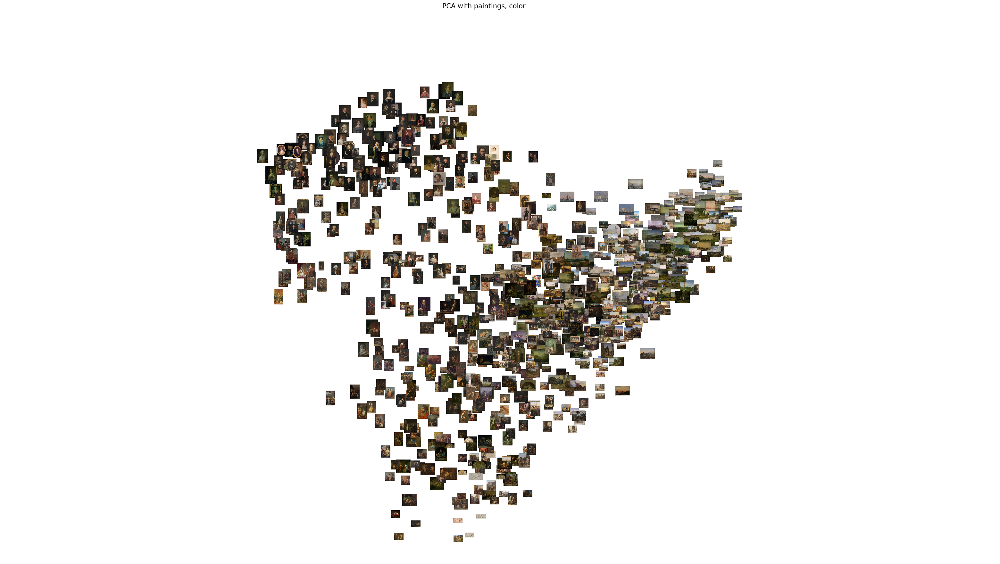

In [9]:
fig, axs = plt.subplots(1, 1, figsize=(40, 20))

pca_binary(axs, color_subset, ds_color, 'embedding', 'pca_paintings_color.png')

fig.suptitle('PCA with paintings, color', size = 15)

In [23]:
# t-SNE on PCA 

def t_sne_plot(ax, df, ds, embedding):

    embeddings_array = np.array(df[embedding].to_list(), dtype=np.float32)

    # to 2 dimensions
    pca = PCA(n_components=50)
    pca_results = pca.fit_transform(embeddings_array)

    X = np.array(pca_results)
    tsne = TSNE(n_components=2, learning_rate=150, perplexity=30, angle=0.2, verbose=2).fit_transform(X)

    tx, ty = tsne[:,0], tsne[:,1]
    tx = (tx-np.min(tx)) / (np.max(tx) - np.min(tx))
    ty = (ty-np.min(ty)) / (np.max(ty) - np.min(ty))

    tnse_results = {'tx': tx,
                    'ty': ty}

    df_tsne = pd.DataFrame(tnse_results)
    
    ax.scatter(df_tsne['tx'], df_tsne['ty'], color='white')

    ax.set_xlabel("")
    ax.set_ylabel("")

    ax.axis("equal")
    ax.set_axis_off()

    for index, row in df_tsne.iterrows():
        # add images to plot
        ab = AnnotationBbox(getImage(ds[index]['image']), (row["tx"], row["ty"]), frameon=False)
        ax.add_artist(ab)

    #plt.savefig(filename)

    np.seterr(divide='ignore', invalid='ignore')

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1687 samples in 0.000s...
[t-SNE] Computed neighbors for 1687 samples in 0.068s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1687
[t-SNE] Computed conditional probabilities for sample 1687 / 1687
[t-SNE] Mean sigma: 7.261848
[t-SNE] Computed conditional probabilities in 0.017s
[t-SNE] Iteration 50: error = 71.8324356, gradient norm = 0.0182731 (50 iterations in 0.236s)
[t-SNE] Iteration 100: error = 70.4357758, gradient norm = 0.0018390 (50 iterations in 0.189s)
[t-SNE] Iteration 150: error = 70.4008636, gradient norm = 0.0008660 (50 iterations in 0.184s)
[t-SNE] Iteration 200: error = 70.4011459, gradient norm = 0.0007202 (50 iterations in 0.185s)
[t-SNE] Iteration 250: error = 70.4012070, gradient norm = 0.0006670 (50 iterations in 0.178s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.401207
[t-SNE] Iteration 300: error = 1.3754416, gradient norm = 0.0090949 (50 iterations in 0.224s)

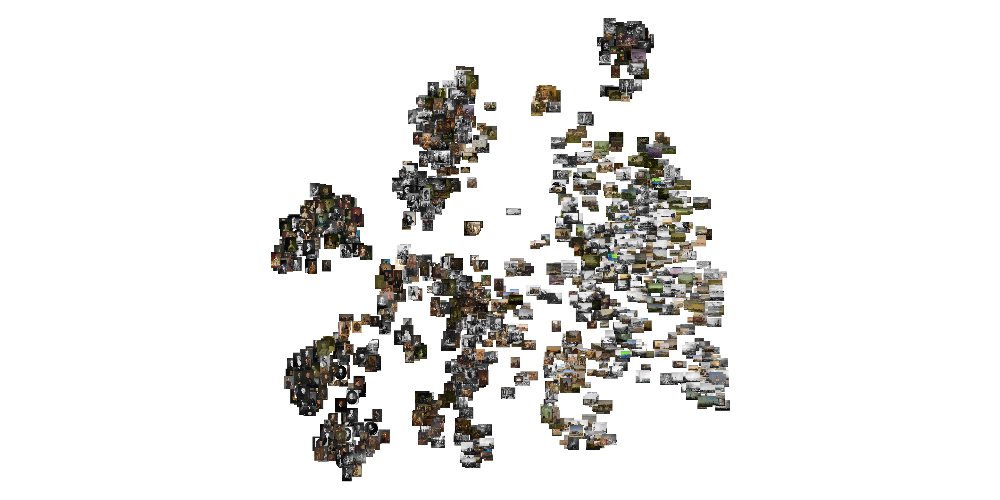

In [7]:
fig, axs = plt.subplots(1, 1, figsize=(40, 20))
t_sne_plot(axs, df, ds, 'grey_embedding')

Cluster distances and density does not mean much; distances between clusters are not meaningful!

In [139]:
def umap_plot(ax, df, ds, embedding, filename, n_components=50):

    embeddings_array = np.array(df[embedding].to_list(), dtype=np.float32)

    # reduce dimensionality
    pca = PCA(n_components=n_components)
    pca_results = pca.fit_transform(embeddings_array)

    X = np.array(pca_results)
    umap_fitted = UMAP(n_components=2, random_state=42).fit_transform(X)
    df_umap = pd.DataFrame(umap_fitted, columns=["umap1", "umap2"])
    
    ax.scatter(df_umap['umap1'], df_umap['umap2'], color='white')

    ax.set_xlabel("")
    ax.set_ylabel("")

    ax.axis("equal")
    ax.set_axis_off()

    for index, row in df_umap.iterrows():
        # add images to plot
        ab = AnnotationBbox(getImage(ds[index]['image']), (row["umap1"], row["umap2"]), frameon=False)
        ax.add_artist(ab)

    plt.savefig(os.path.join(data_path, filename), format='eps', dpi=1200)

    np.seterr(divide='ignore', invalid='ignore')

Text(0.5, 0.98, 'UMAP on greyscaled embeddings, with n_PCA_components=50')

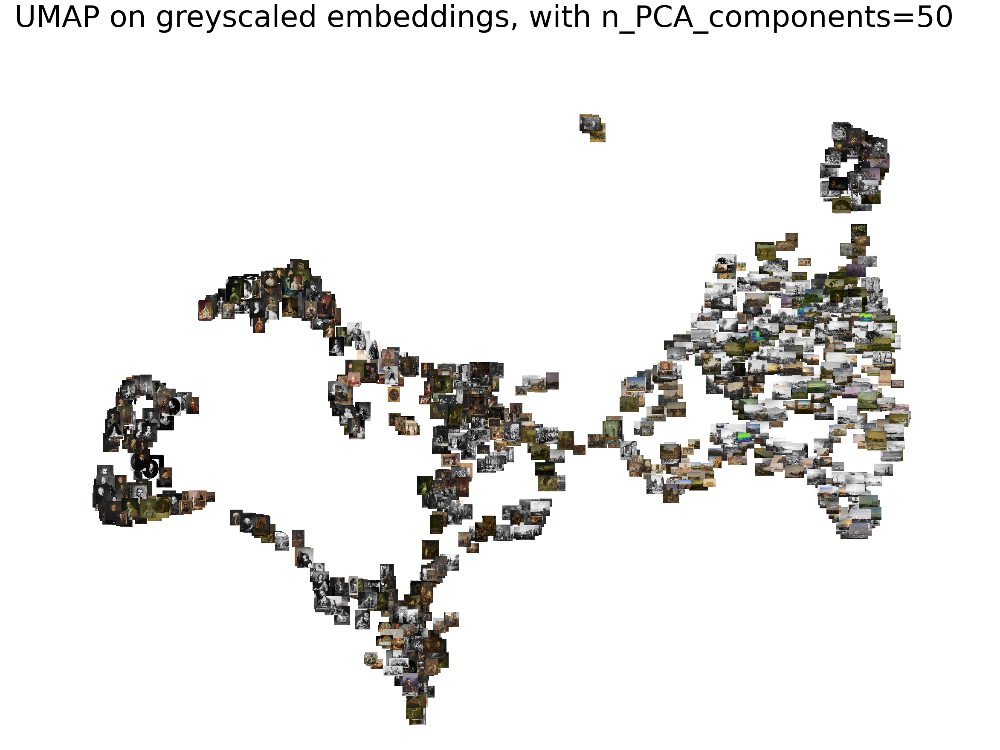

In [ ]:
# umap
fig, axs = plt.subplots(1, 1, figsize=(20, 15))
umap_plot(axs, df, ds, 'grey_embedding', 'umap_n50_greyscaled.png')
#fig.suptitle('UMAP on greyscaled embeddings, with n_PCA_components=50', size = 50)

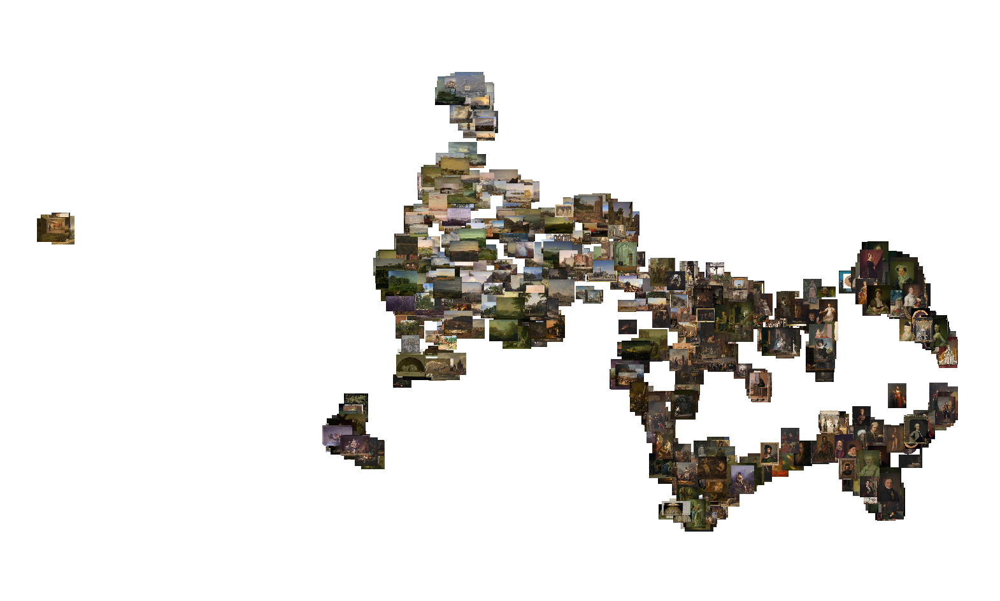

In [ ]:
# umap
fig, axs = plt.subplots(1, 1, figsize=(20, 12))
umap_plot(axs, color_subset, ds_color, 'embedding', 'umap_n50_colored.eps')

In [142]:
# test annotation boxes with subset of data

color_df_subset = color_subset.iloc[0:55]
color_ds_subset = ds_color.select(range(55))

In [150]:
#from mpl_toolkits.axes_grid1.inset_locator import inset_axes, mark_inset
from matplotlib.patches import Rectangle

In [151]:
def umap_with_zoom(ax, df, ds, embedding, filename, n_components=50,
              zoom_region=None, zoom_factor=0.08):

    #def getImage(img, zoom=0.02):
        #return OffsetImage(np.array(img), zoom=zoom, cmap='gray' if len(np.array(img).shape) == 2 else None)

    def getImage(img, zoom=0.02):
        return OffsetImage(np.array(img), zoom=zoom)
    
    embeddings_array = np.array(df[embedding].to_list(), dtype=np.float32)

    # reduce dimensionality
    pca = PCA(n_components=n_components)
    pca_results = pca.fit_transform(embeddings_array)

    X = np.array(pca_results)
    umap_fitted = UMAP(n_components=2, random_state=42).fit_transform(X)
    df_umap = pd.DataFrame(umap_fitted, columns=["umap1", "umap2"])
    
    ax.scatter(df_umap['umap1'], df_umap['umap2'], color='white')
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.axis("equal")
    ax.set_axis_off()

    # Plot all images at default zoom
    for index, row in df_umap.iterrows():
        ab = AnnotationBbox(getImage(ds[index]['image']), (row["umap1"], row["umap2"]), frameon=False)
        ax.add_artist(ab)

    # Optional: zoom overlay
    if zoom_region is not None:
        x1, x2, y1, y2 = zoom_region

        # Highlight zoom area
        rect = Rectangle((x1, y1), x2 - x1, y2 - y1,
                         linewidth=1.5, edgecolor='red', facecolor='none')
        ax.add_patch(rect)

        # Re-plot same images in zoomed area at higher zoom
        for index, row in df_umap.iterrows():
            x, y = row["umap1"], row["umap2"]
            if x1 <= x <= x2 and y1 <= y <= y2:
                ab = AnnotationBbox(getImage(ds[index]['image'], zoom=zoom_factor), (x, y), frameon=False)
                ax.add_artist(ab)

    # Save figure
    plt.savefig(os.path.join(data_path, filename), format='eps', dpi=1200)
    np.seterr(divide='ignore', invalid='ignore')


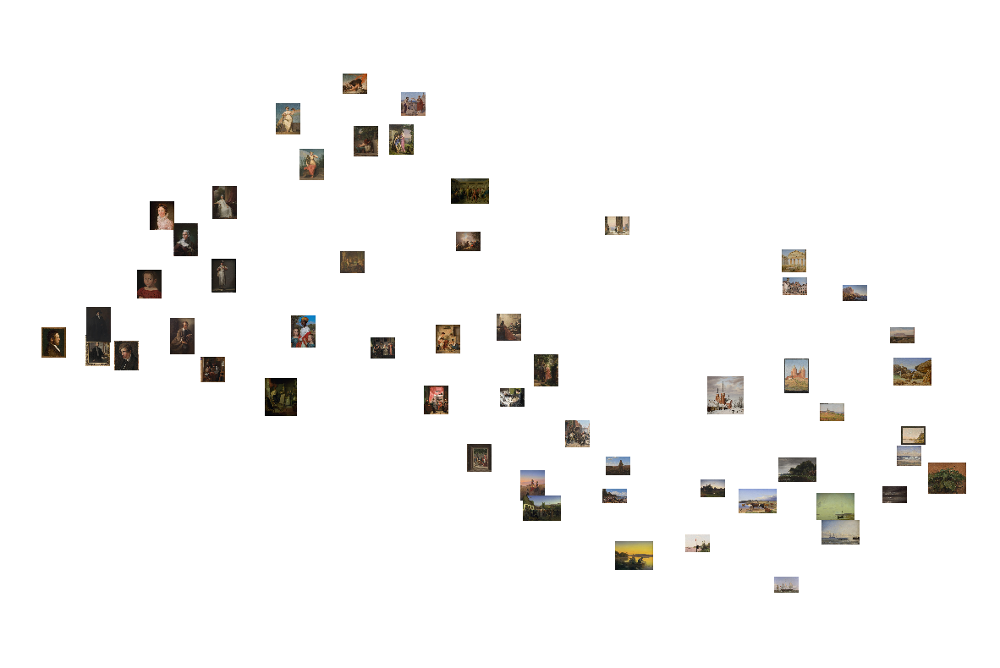

In [152]:
fig, axs = plt.subplots(1, 1, figsize=(15, 10))
zoom_area = (0.1, 0.3, 0.4, 0.6)
umap_with_zoom(axs, color_df_subset, color_ds_subset, 'embedding', 'testy.eps', zoom_region=zoom_area)

### Clustering approaches

In [10]:
from sklearn.metrics import silhouette_score

In [11]:
X = np.vstack(df['grey_embedding'].values)

In [12]:
def check_groups(df, embedding_col, variable):
    
    X = np.vstack(df[embedding_col].values)
    y = df[variable].values

    sil_score = silhouette_score(X, df[variable])

    return sil_score

In [13]:
def calc_intragroup_cosim(df, embedding_col, variable):

    # remove rows with NA for variable column

    df = df.dropna(subset = variable)

    labels = df[variable].unique().tolist()

    # remove labels with only one sample
    label_counts = df[variable].value_counts()
    labels = label_counts[label_counts > 1].index.tolist()

    #labels = [label for label in labels if label not in labels_to_remove]

    result_dict = {}
    
    for label in labels:
        group = df[df[variable] == label]
        group_embeddings = np.stack(group[embedding_col].values)
        cosim_matrix = cosine_similarity(group_embeddings)
        mean_cosim = cosim_matrix[np.triu_indices_from(cosim_matrix, k=1)].mean()
        #mean_cosim = cosine_similarity(group_embeddings).mean()
        std_cosim = cosine_similarity(group_embeddings).std()
        n_samples = len(group)
        result_dict[label] = {'mean_cosim': mean_cosim, 'std_cosim': std_cosim, 'n_samples': n_samples}
    
    result_df = pd.DataFrame.from_dict(result_dict, orient='index')
    
    return result_df

In [18]:
def cal_intergroup_cosim(df, embedding_col, variable):
    
    df = df.dropna(subset = variable)
    labels = df[variable].unique().tolist()

    # remove labels with only one sample
    label_counts = df[variable].value_counts()
    labels = label_counts[label_counts > 1].index.tolist()

    result_dict = {} # mean cosine similarity between an artist and the mean embedding of all other artists

    for label in labels:

        group = df[df[variable] == label] # df with only artist
        group_embeddings = np.stack(group[embedding_col].values) # embeddings for single artist
        
        # get mean embedding of that artist
        mean_label_embedding = group_embeddings.mean(axis=0)

        other_labels = [l for l in labels if l != label]

        cosim_between_list = []
        for l in other_labels:
            label_group = df[df[variable] == l] # df with only artist
            label_group_embeddings = np.stack(label_group[embedding_col].values) # embeddings for single artist
            mean_label_embedding_new = label_group_embeddings.mean(axis=0)

            cosim_between = cosine_similarity(np.stack([mean_label_embedding_new, mean_label_embedding]))[0][1]
            cosim_between_list.append(cosim_between)

        mean_cosims = np.mean(cosim_between_list)
        sd_cosims = np.std(cosim_between_list)

        n_samples = len(group)
        result_dict[label] = {'mean_cosim': mean_cosims, 'std_cosim': sd_cosims, 'n_paintings': n_samples}

        
    result_df = pd.DataFrame.from_dict(result_dict, orient='index')
    
    return result_df

In [19]:
intergroup_artist_cosims = cal_intergroup_cosim(df, 'grey_embedding', 'first_artist')

In [27]:
intergroup_artist_cosims.sort_values(by='mean_cosim', ascending=False).head(10)

,mean_cosim,std_cosim,n_paintings
C.W. Eckersberg,0.772335,0.074400,89
Jørgen Roed,0.752920,0.082856,23
J.C. Dahl,0.749860,0.111163,29
Erik Pauelsen,0.747597,0.084563,30
Christen Købke,0.745070,0.086706,62
Constantin Hansen,0.734622,0.082667,54
Johan Thomas Lundbye,0.734272,0.111844,39
Fritz Petzholdt,0.732109,0.099603,7
Wilhelm Marstrand,0.732096,0.089667,49
Ubekendt,0.728998,0.080794,95


In [21]:
variables = ['first_artist', 'materials', 'technique', 'start_year', 'first_tag']

test = df.dropna(subset=variables)
vals = {}

for col in variables:
    sil_score = check_groups(test, 'grey_embedding', col)
    cosim_df = calc_intragroup_cosim(df, 'grey_embedding', col)
    mean_cosim = cosim_df['mean_cosim'].mean()
    cosim_sd = cosim_df['mean_cosim'].std()
    inter_cosim_df = cal_intergroup_cosim(df, 'grey_embedding', col)
    mean_inter_cosim = inter_cosim_df['mean_cosim'].mean()
    sd_inter_cosim = inter_cosim_df['mean_cosim'].std()

    vals[col] = {'silhoutte_score': sil_score, 'mean_intra_cosim': mean_cosim, 'sd_intra_cosim': cosim_sd, 'mean_inter_cosim': mean_inter_cosim, 'sd_inter_cosim': sd_inter_cosim}

result_df = pd.DataFrame.from_dict(vals, orient='index')

In [22]:
result_df

,silhoutte_score,mean_intra_cosim,sd_intra_cosim,mean_inter_cosim,sd_inter_cosim
first_artist,-0.197491,0.617178,0.110364,0.644986,0.062025
materials,-0.099966,0.492237,0.069501,0.733982,0.082429
technique,-0.228914,0.526240,0.089386,0.697717,0.087858
start_year,-0.111580,0.494182,0.058207,0.802006,0.047859
first_tag,-0.223371,0.561853,0.110734,0.678800,0.068163


- I had to remove groups with only 1 sample in them as well as rows with NA

-  Silhouette score: "The best value is 1 and the worst value is -1. Values near 0 indicate overlapping clusters. Negative values generally indicate that a sample has been assigned to the wrong cluster, as a different cluster is more similar."

- Looks like cosine similarities for each artist was quite influenced by group size; the artists with the most paintings also had the lowest in-group similarities 

- Inter-group cosims: calculated the mean embedding of each group (e.g., each artist) and compared this to the mean embeddings of all other groups with cosine similarity --> take the mean cosine similarity between that group and all other groups. In the end, take the mean cosine similarity of all the resulting cosine similarities

### Look at 'innovative' time period

In [68]:
# create time period subsets of dataframe and images

in_df = df.query('start_year > 1780 & start_year<1810')
in_idx = in_df.index.tolist()
in_ds = ds.select(in_idx)

no_in_df = df.query('start_year <= 1780')
no_in_idx = no_in_df.index.tolist()
no_in_ds = ds.select(no_in_idx)

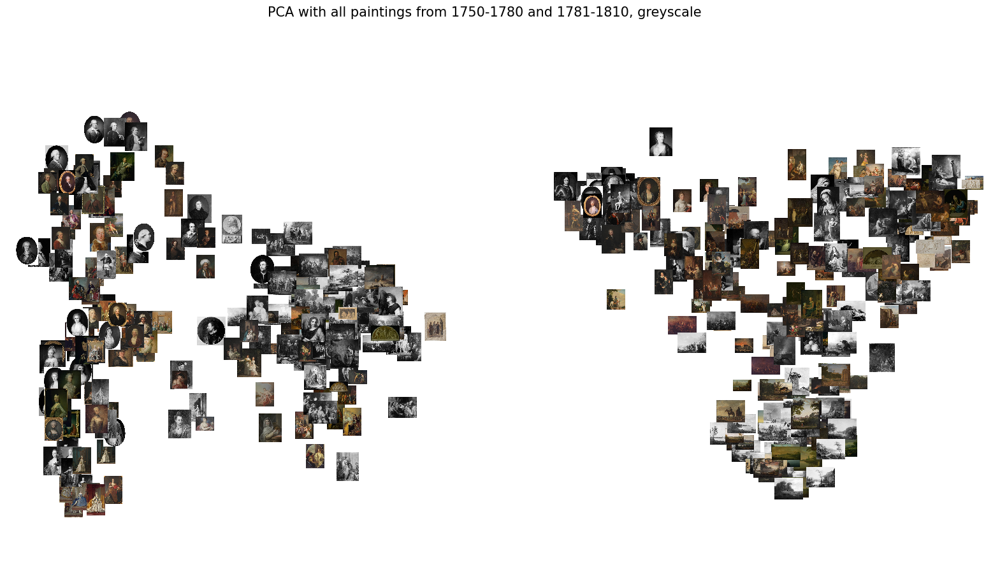

In [73]:
fig, axs = plt.subplots(1, 2, figsize=(20, 10))

pca_binary(axs[0], no_in_df, no_in_ds, 'grey_embedding')
pca_binary(axs[1], in_df, in_ds, 'grey_embedding')

fig.suptitle('PCA with all paintings from 1750-1780 and 1781-1810, greyscale', size = 15)
plt.savefig('innovation_pca_greyscale.png')

#### Color

In [71]:
# define time period subsets
in_df_color = color_subset.query('start_year > 1780 & start_year<=1810')
in_idx_color = in_df_color.index.tolist()
in_ds_color = ds_color.select(in_idx_color)

no_in_df_color = color_subset.query('start_year <= 1780')
no_in_idx_color = no_in_df_color.index.tolist()
no_in_ds_color = ds_color.select(no_in_idx_color)

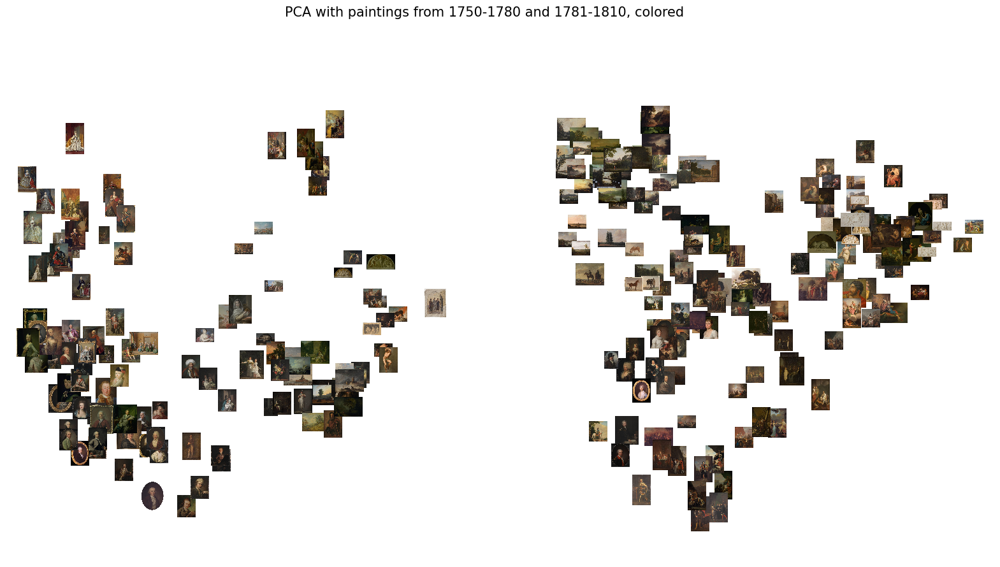

In [74]:
fig, axs = plt.subplots(1, 2, figsize=(20, 10))
pca_binary(axs[0], no_in_df_color, no_in_ds_color, 'embedding')
pca_binary(axs[1], in_df_color, in_ds_color, 'embedding')
fig.suptitle('PCA with paintings from 1750-1780 and 1781-1810, colored', size = 15)
plt.savefig('innovation_pca_color.png')

In [88]:
# canon only, color
canon_color_only = in_df_color.query('exb_canon == "canon"')
in_idx_color_canon = canon_color_only.index.tolist()
in_ds_color_canon = ds_color.select(in_idx_color_canon)

no_in_canon_color_only = no_in_df_color.query('exb_canon == "canon"')
no_in_canon_color_idx = no_in_canon_color_only.index.tolist()
no_in_ds_color_canon = ds_color.select(no_in_canon_color_idx)

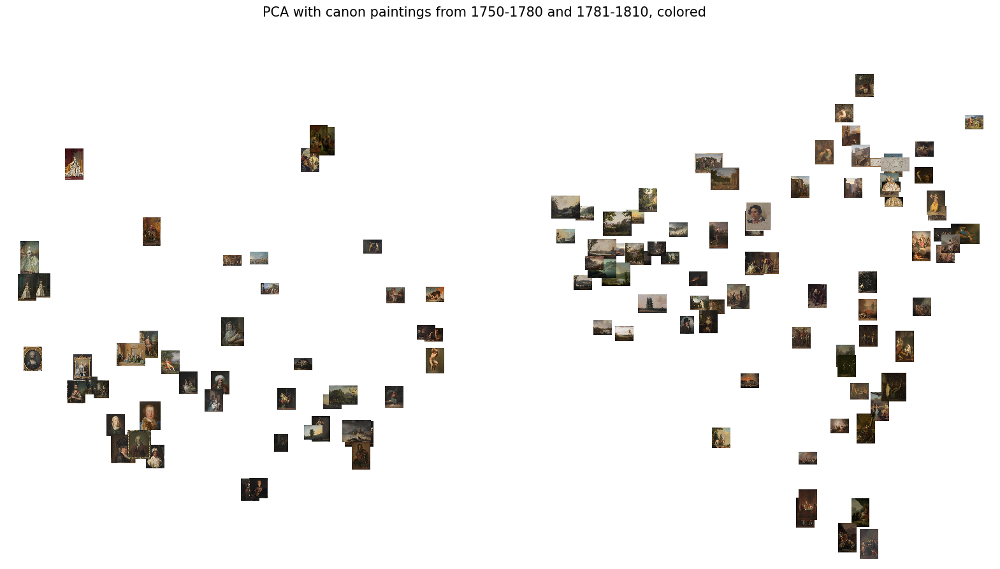

In [89]:
fig, axs = plt.subplots(1, 2, figsize=(20, 10))
pca_binary(axs[0], no_in_canon_color_only, no_in_ds_color_canon, 'embedding')
pca_binary(axs[1], canon_color_only, in_ds_color_canon, 'embedding')
fig.suptitle('PCA with canon paintings from 1750-1780 and 1781-1810, colored', size = 15)
plt.savefig('innovation_pca_canon_color.png')

In [78]:
# canon only, greyscale
canon_only = in_df.query('exb_canon == "canon"')
in_idx_canon = canon_only.index.tolist()
in_ds_canon = ds.select(in_idx_canon)

no_in_canon_only = no_in_df.query('exb_canon == "canon"')
no_in_canon_idx = no_in_canon_only.index.tolist()
no_in_ds_canon = ds.select(no_in_canon_idx)

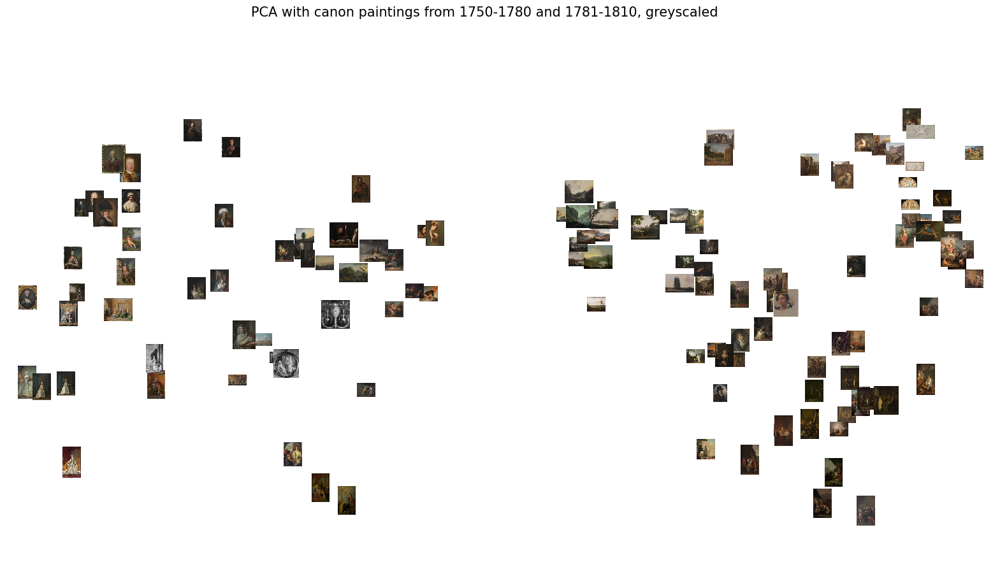

In [79]:
fig, axs = plt.subplots(1, 2, figsize=(20, 10))
pca_binary(axs[0], no_in_canon_only, no_in_ds_canon, 'grey_embedding')
pca_binary(axs[1], canon_only, in_ds_canon, 'grey_embedding')
fig.suptitle('PCA with canon paintings from 1750-1780 and 1781-1810, greyscaled', size = 15)
plt.savefig('innovation_pca_canon_greyscale.png')

#### Non-canon

In [92]:
# non-canon, greyscale
others_only = in_df.query('exb_canon == "other"')
in_idx_others = others_only.index.tolist()
in_ds_others = ds.select(in_idx_others)

no_in_others = no_in_df.query('exb_canon == "other"')
no_in_others_idx = no_in_others.index.tolist()
no_in_ds_other = ds.select(no_in_others_idx)

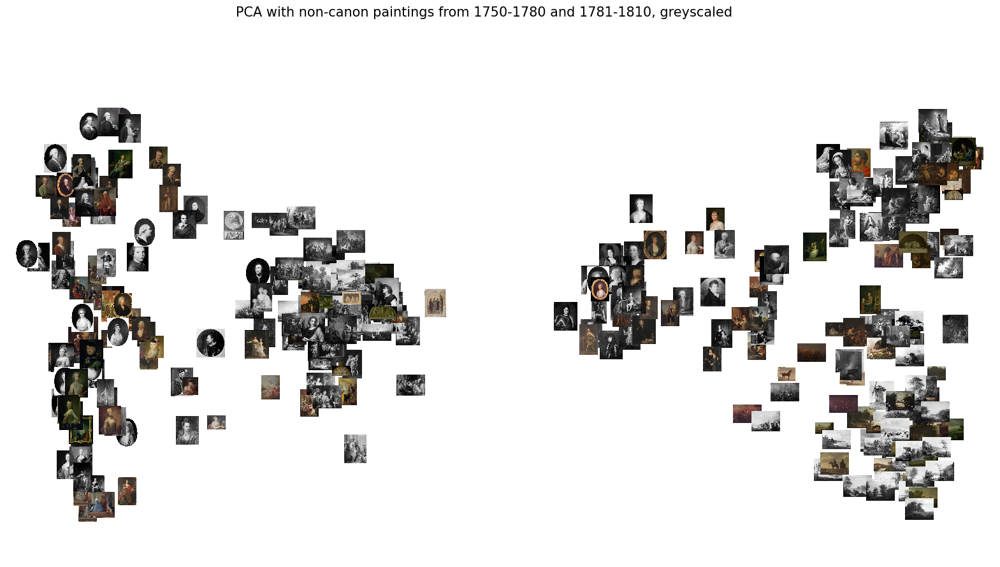

In [93]:
fig, axs = plt.subplots(1, 2, figsize=(20, 10))
pca_binary(axs[0], no_in_others, no_in_ds_other, 'grey_embedding')
pca_binary(axs[1], others_only, in_ds_others, 'grey_embedding')
fig.suptitle('PCA with non-canon paintings from 1750-1780 and 1781-1810, greyscaled', size = 15)
plt.savefig('innovation_pca_non_canon_greyscale.png')

In [94]:
# non-canon, color
others_only_color = in_df_color.query('exb_canon == "other"')
in_idx_others_color = others_only_color.index.tolist()
in_ds_others_color = ds_color.select(in_idx_others_color)

no_in_others_color = no_in_df_color.query('exb_canon == "other"')
no_in_others_idx_color = no_in_others_color.index.tolist()
no_in_ds_other_color = ds_color.select(no_in_others_idx_color)

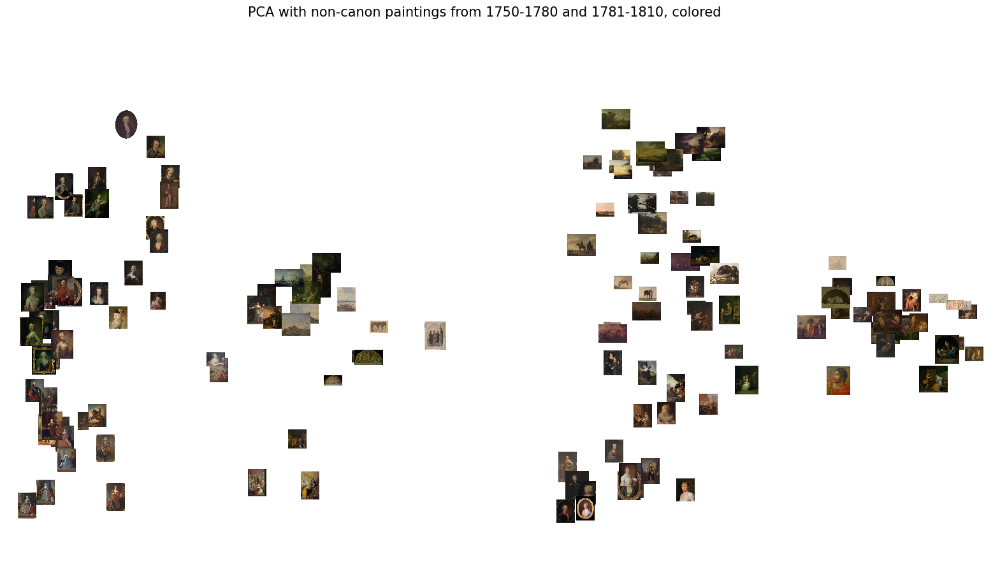

In [95]:
fig, axs = plt.subplots(1, 2, figsize=(20, 10))
pca_binary(axs[0], no_in_others_color, no_in_ds_other_color, 'embedding')
pca_binary(axs[1], others_only_color, in_ds_others_color, 'embedding')
fig.suptitle('PCA with non-canon paintings from 1750-1780 and 1781-1810, colored', size = 15)
plt.savefig('innovation_pca_non_canon_color.png')

#### PCA without images

In [90]:
def pca_binary_dots(ax, df, embedding, canon_category, title):
    embeddings_array = np.array(df[embedding].to_list(), dtype=np.float32)
    
    color_mapping = {'other': '#129525', 'canon': '#75BCC6'}

    # to 2 dimensions
    pca = PCA(n_components=2)
    pca_results = pca.fit_transform(embeddings_array)
    df_pca = pd.DataFrame(pca_results, columns=["PCA1", "PCA2"])
    df_pca["canon"] = df[canon_category].values

    # Plot each category
    for category in df_pca["canon"].unique():
        subset = df_pca[df_pca["canon"] == category]

        #marker = markers_dict.get(category) 
        #alpha = alpha_dict.get(category)
        
        ax.scatter(
            subset["PCA1"],
            subset["PCA2"],
            color=color_mapping.get(category),
            label=category,
            alpha=0.4,
            edgecolor='black',
            s=110,
            marker='o' #marker
        )

    ax.set_title(title)
    ax.set_xlabel("PCA1")
    ax.set_ylabel("PCA2")

    legend_handles = [Patch(facecolor=color, label=label) for label, color in color_mapping.items()]
    ax.legend(handles=legend_handles, loc='upper right')

    ax.axis("equal")

    # supress warnings 

    np.seterr(divide='ignore', invalid='ignore')

Text(0.5, 0.95, 'PCA with exb_canon')

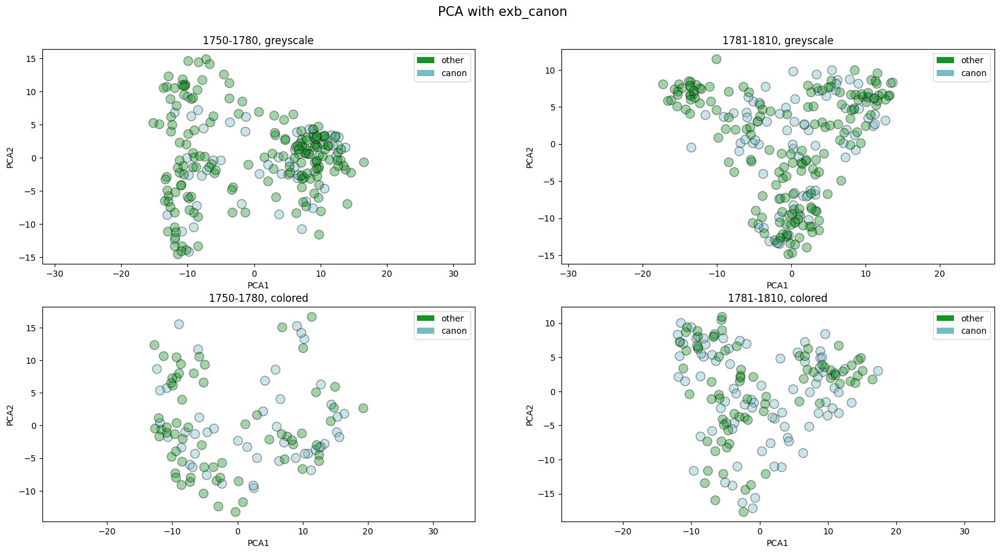

In [91]:
fig, axs = plt.subplots(2, 2, figsize=(20, 10))

pca_binary_dots(axs[0,0], no_in_df, 'grey_embedding', "exb_canon", "1750-1780, greyscale")
pca_binary_dots(axs[1,0], no_in_df_color, 'embedding', "exb_canon", "1750-1780, colored")
pca_binary_dots(axs[0,1], in_df, 'grey_embedding', "exb_canon", "1781-1810, greyscale" )
pca_binary_dots(axs[1,1], in_df_color, 'embedding', "exb_canon", "1781-1810, colored" )

fig.suptitle('PCA with exb_canon', size = 15, y=0.95)

### Classify canon vs non-canon

In [27]:
from sklearn.metrics import classification_report
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_validate, cross_val_score
from imblearn.under_sampling import RandomUnderSampler
from imblearn.combine import SMOTEENN
from collections import Counter
from imblearn.pipeline import Pipeline, make_pipeline
from sklearn.linear_model import LogisticRegression

In [ ]:
def run_classification(df, embedding_col, canon_col, classifier, resample, sample_before, cv, random_state):
    
    X = np.array(df[embedding_col].tolist())
    y = np.array(df[canon_col])

    if classifier == 'mlp':
        clf = MLPClassifier(random_state=random_state,
            hidden_layer_sizes=(100,),
            learning_rate='adaptive',
            early_stopping=False,
            verbose=False,
            max_iter=100)
    
    else:
        clf = LogisticRegression(random_state=random_state)

    if resample == True:
        if sample_before == True:
            rus = RandomUnderSampler(random_state=random_state)
            X, y = rus.fit_resample(X, y)
            print(sorted(Counter(y).items()))

            if cv == True: 
                scores = cross_val_score(clf, X, y, cv=10, scoring='f1_macro')
                print(f"Mean macro f1 cross val score: {scores.mean()}, sd: {scores.std()}")
                return
            
            else: # if resample == True and sample_before == True, but no cv
                X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=random_state, stratify=y)
                clf.fit(X_train, y_train)
                y_pred = clf.predict(X_test)
                print(classification_report(y_test, y_pred))
                return 

        else: # resampling, but sample after splitting
            if cv == True:
                imba_pipeline = make_pipeline(RandomUnderSampler(random_state=random_state), clf)
        
                cross_vals = cross_val_score(imba_pipeline, X, y, scoring='f1_macro', cv=10)

                print(f"Mean macro f1 cross val score: {cross_vals.mean()}, sd: {cross_vals.std()}")
                return 
            
            else: # no cross validation
                X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=random_state, stratify=y)
                rus = RandomUnderSampler(random_state=random_state)
                X_train_resampled, y_train_resampled = rus.fit_resample(X_train, y_train)
                clf.fit(X_train_resampled, y_train_resampled)
                y_pred = clf.predict(X_test)
                print(classification_report(y_test, y_pred))
                return 
    
    else: # no resampling
        if cv == True:
            scores = cross_val_score(clf, X, y, cv=10, scoring='f1_macro')
            print(f"Mean macro f1 cross val score: {scores.mean()}, sd: {scores.std()}")
            return 
        
        else: # no resampling and no cross validation
            X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=random_state, stratify=y)
            clf.fit(X_train, y_train)
            y_pred = clf.predict(X_test)
            print(classification_report(y_test, y_pred))
            return 

In [64]:
run_classification(df=df, 
                   embedding_col = 'grey_embedding', 
                   canon_col = 'exb_canon', 
                   classifier = 'mlp', 
                   resample=True, 
                   sample_before=True, 
                   cv=False, 
                   random_state=100)

[('canon', 643), ('other', 643)]
              precision    recall  f1-score   support

       canon       0.70      0.67      0.69       129
       other       0.69      0.71      0.70       129

    accuracy                           0.69       258
   macro avg       0.69      0.69      0.69       258
weighted avg       0.69      0.69      0.69       258



In [65]:
run_classification(df=df, 
                   embedding_col = 'grey_embedding', 
                   canon_col = 'exb_canon', 
                   classifier = 'mlp', 
                   resample=True, 
                   sample_before=False, 
                   cv=False, 
                   random_state=100)

              precision    recall  f1-score   support

       canon       0.61      0.71      0.66       129
       other       0.80      0.72      0.76       209

    accuracy                           0.72       338
   macro avg       0.71      0.72      0.71       338
weighted avg       0.73      0.72      0.72       338



In [68]:
run_classification(df=color_subset, 
                   embedding_col = 'embedding', 
                   canon_col = 'exb_canon', 
                   classifier = 'mlp', 
                   resample=False, 
                   sample_before=False, 
                   cv=False, 
                   random_state=100)

              precision    recall  f1-score   support

       canon       0.69      0.71      0.70       120
       other       0.64      0.61      0.62       100

    accuracy                           0.66       220
   macro avg       0.66      0.66      0.66       220
weighted avg       0.66      0.66      0.66       220



In [82]:
# check different random states
import random

random_states = random.sample(range(1, 20000), 5)

for state in random_states:

    run_classification(df=df, 
                   embedding_col = 'grey_embedding', 
                   canon_col = 'exb_canon', 
                   classifier = 'mlp', 
                   resample=True, 
                   sample_before=False, 
                   cv=True, 
                   random_state=state)

Mean macro f1 cross val score: 0.6816907493206213, sd: 0.0492776004723948
Mean macro f1 cross val score: 0.6874967033275995, sd: 0.04373055817828722
Mean macro f1 cross val score: 0.6880647870423281, sd: 0.046248863392909303
Mean macro f1 cross val score: 0.7011956959692119, sd: 0.052903094170902665
Mean macro f1 cross val score: 0.7006694325103456, sd: 0.04538768411166972


In [80]:
random_states = random.sample(range(1, 20000), 5)

for state in random_states:

    run_classification(df=color_subset, 
                   embedding_col = 'embedding', 
                   canon_col = 'exb_canon', 
                   classifier = 'mlp', 
                   resample=True, 
                   sample_before=False, 
                   cv=True, 
                   random_state=state)

Mean macro f1 cross val score: 0.6300127322664973, sd: 0.053300283037077054
Mean macro f1 cross val score: 0.6145196728260098, sd: 0.04738046245503561
Mean macro f1 cross val score: 0.6113781043091889, sd: 0.05302478912320203
Mean macro f1 cross val score: 0.6122467640022269, sd: 0.04783999331916939
Mean macro f1 cross val score: 0.6344495723434418, sd: 0.060247100370984866


In [83]:
ds

Dataset({
    features: ['smk_id', 'period', 'start_year', 'title', 'first_artist', 'all_artists', 'num_artists', 'main_type', 'all_types', 'image_thumbnail', 'gender', 'birth_death', 'nationality', 'history', 'artist_roles', 'creator_roles', 'num_creators', 'techniques', 'enrichment_url', 'content_person', 'has_text', 'colors', 'geo_location', 'entropy', 'tags_en', 'image', 'rgb'],
    num_rows: 1687
})

In [84]:
ds_subset = ds.select(range(10))

### Convert all images to greyscale for plotting purposes

In [86]:
import cv2 
from PIL import Image

In [107]:
grey_images = []

feature = Image_ds(decode=False)

for i in tqdm(range(len(ds))):
    image = ds[i]['image']
    image_grayscale = image.convert('L')
    image_encoded = feature.encode_example(image_grayscale) # in order to add an image to a HF dataset column, the image needs to be encoded properly
    grey_images.append(image_encoded)

ds = ds.add_column('grey_image', grey_images)
ds = ds.cast_column('grey_image', Image_ds(decode=True))

100%|██████████| 1687/1687 [04:52<00:00,  5.77it/s]


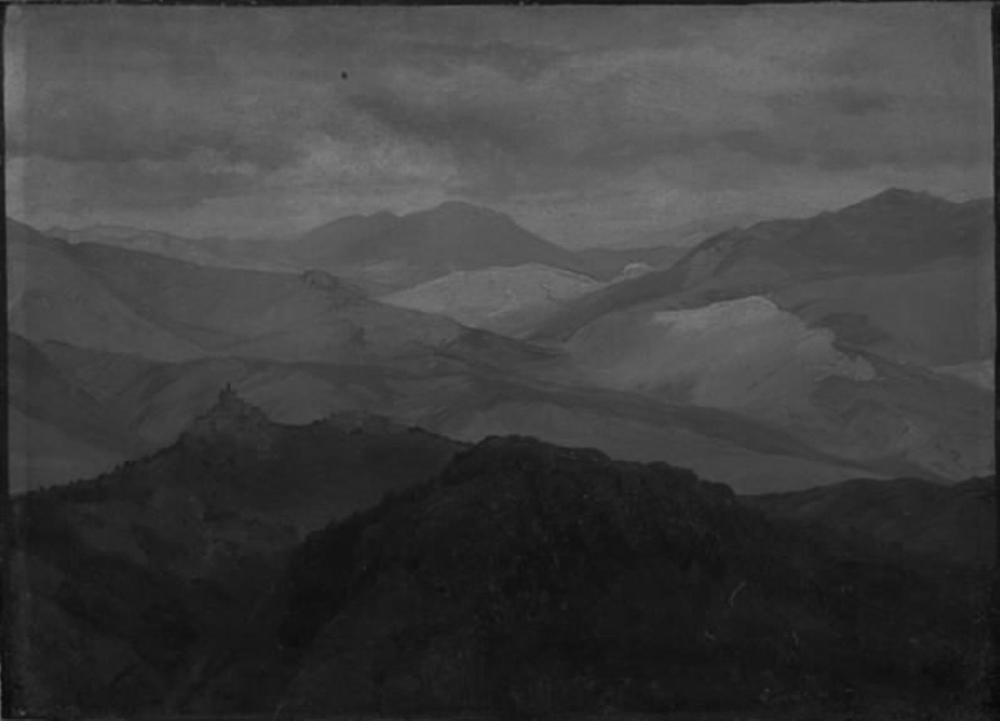

In [114]:
ds[200]['grey_image']

In [126]:
# create subsets

ds_subset = ds.select(range(55))
df_subset = df.iloc[0:55]

In [137]:
def grey_umap_plot(ax, df, ds, embedding, filename, n_components=50):

    def getImage(img):
        return OffsetImage(np.array(img), zoom=.02, cmap='gray')

    embeddings_array = np.array(df[embedding].to_list(), dtype=np.float32)

    # reduce dimensionality
    pca = PCA(n_components=n_components)
    pca_results = pca.fit_transform(embeddings_array)

    X = np.array(pca_results)
    umap_fitted = UMAP(n_components=2, random_state=42).fit_transform(X)
    df_umap = pd.DataFrame(umap_fitted, columns=["umap1", "umap2"])
    
    ax.scatter(df_umap['umap1'], df_umap['umap2'], color='white')

    ax.set_xlabel("")
    ax.set_ylabel("")

    ax.axis("equal")
    ax.set_axis_off()

    for index, row in df_umap.iterrows():
        # add images to plot
        ab = AnnotationBbox(getImage(ds[index]['grey_image']), (row["umap1"], row["umap2"]), frameon=False)
        ax.add_artist(ab)

    plt.savefig(os.path.join(data_path, filename), format='eps', dpi=1200)

    np.seterr(divide='ignore', invalid='ignore')

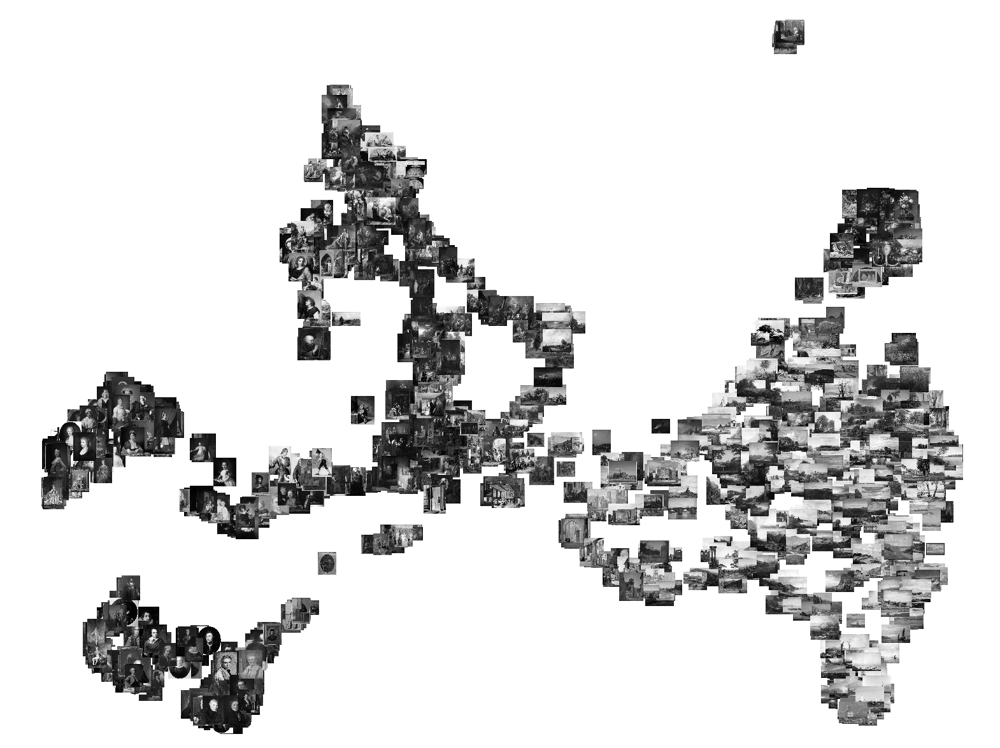

In [ ]:
# umap with greyscaled images
fig, axs = plt.subplots(1, 1, figsize=(20, 15))
grey_umap_plot(axs, df, ds, 'grey_embedding', 'umap_n50_greyscaled_GREY.eps')